In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [11]:
path = '../Resources_Output/macro_economic_data_population_wide.csv'
data = pd.read_csv(path)

data.head()


,Unnamed: 0,country,years,"Population, total","Population ages 00-04, (% of population)","Population ages 05-09, (% of population)","Population ages 10-14, (% of population)","Population ages 15-19, (% of population)","Population ages 20-24, (% of population)","Population ages 25-29, (% of population)",...,"Population ages 35-39, (% of population)","Population ages 40-44, (% of population)","Population ages 45-49, (% of population)","Population ages 50-54, (% of population)","Population ages 55-59, (% of population)","Population ages 60-64, (% of population)","Population ages 65-69, (% of population)","Population ages 70-74, (% of population)","Population ages 75-79, (% of population)","Population ages 80 and above, (% of population)"
0,0,Afghanistan,1961,9214083.0,34.428915,26.359045,23.363518,20.628007,17.700997,15.283814,...,11.144825,9.299025,7.726049,6.289341,5.095110,3.859910,2.735462,1.681458,0.828729,0.365206
1,1,Afghanistan,1962,9404406.0,34.654533,26.564044,23.089889,20.791671,17.621578,15.264896,...,11.151110,9.279892,7.702293,6.263756,5.042119,3.837494,2.703375,1.675005,0.829103,0.371645
2,2,Afghanistan,1963,9604487.0,34.882654,26.759469,22.900307,20.869184,17.561264,15.247672,...,11.152464,9.260933,7.676416,6.245131,4.986267,3.818766,2.670058,1.668591,0.828532,0.377645
3,3,Afghanistan,1964,9814318.0,35.107896,26.952498,22.818278,20.821519,17.557706,15.205975,...,11.137576,9.245795,7.650622,6.226406,4.936880,3.796219,2.640725,1.660116,0.827507,0.383040
4,4,Afghanistan,1965,10036008.0,35.326800,27.141304,22.868356,20.621078,17.619636,15.139388,...,11.104902,9.233071,7.626674,6.205011,4.897032,3.767998,2.616662,1.649230,0.826366,0.387818


In [12]:
path2 = '../Resources_Output/countries_UN_referential.csv'
countries = pd.read_csv(path2)

countries.head()

,country,iso3Code,iso2Code,region,continent,sub-region,capitalCity,longitude,latitude
0,Aruba,ABW,AW,Latin America & Caribbean,Latin America & Caribbean,NaN,Oranjestad,-70.0167,12.51670
1,Afghanistan,AFG,AF,South Asia,Asia,NaN,Kabul,69.1761,34.52280
2,Angola,AGO,AO,Sub-Saharan Africa,Africa,Central Africa,Luanda,13.2420,-8.81155
3,Albania,ALB,AL,Europe & Central Asia,Europe,NaN,Tirane,19.8172,41.33170
4,Andorra,AND,AD,Europe & Central Asia,Europe,NaN,Andorra la Vella,1.5218,42.50750


In [13]:
new_df = pd.merge(data, countries, on='country')
new_df

,Unnamed: 0,country,years,"Population, total","Population ages 00-04, (% of population)","Population ages 05-09, (% of population)","Population ages 10-14, (% of population)","Population ages 15-19, (% of population)","Population ages 20-24, (% of population)","Population ages 25-29, (% of population)",...,"Population ages 75-79, (% of population)","Population ages 80 and above, (% of population)",iso3Code,iso2Code,region,continent,sub-region,capitalCity,longitude,latitude
0,0,Afghanistan,1961,9214083.0,34.428915,26.359045,23.363518,20.628007,17.700997,15.283814,...,0.828729,0.365206,AFG,AF,South Asia,Asia,NaN,Kabul,69.1761,34.5228
1,1,Afghanistan,1962,9404406.0,34.654533,26.564044,23.089889,20.791671,17.621578,15.264896,...,0.829103,0.371645,AFG,AF,South Asia,Asia,NaN,Kabul,69.1761,34.5228
2,2,Afghanistan,1963,9604487.0,34.882654,26.759469,22.900307,20.869184,17.561264,15.247672,...,0.828532,0.377645,AFG,AF,South Asia,Asia,NaN,Kabul,69.1761,34.5228
3,3,Afghanistan,1964,9814318.0,35.107896,26.952498,22.818278,20.821519,17.557706,15.205975,...,0.827507,0.383040,AFG,AF,South Asia,Asia,NaN,Kabul,69.1761,34.5228
4,4,Afghanistan,1965,10036008.0,35.326800,27.141304,22.868356,20.621078,17.619636,15.139388,...,0.826366,0.387818,AFG,AF,South Asia,Asia,NaN,Kabul,69.1761,34.5228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13666,13666,Zimbabwe,2019,15271368.0,29.637536,30.093325,25.601035,22.636271,16.414752,13.527113,...,1.077652,0.943444,ZWE,ZW,Sub-Saharan Africa,Africa,Eastern Africa,Harare,31.0672,-17.8312
13667,13667,Zimbabwe,2020,15526888.0,29.026730,29.710231,25.870347,22.679395,17.074611,13.199794,...,1.099067,0.927262,ZWE,ZW,Sub-Saharan Africa,Africa,Eastern Africa,Harare,31.0672,-17.8312
13668,13668,Zimbabwe,2021,15797210.0,28.638350,29.027286,26.310096,22.593356,17.798661,12.987592,...,1.113749,0.906057,ZWE,ZW,Sub-Saharan Africa,Africa,Eastern Africa,Harare,31.0672,-17.8312
13669,13669,Zimbabwe,2022,16069056.0,28.436836,28.186736,26.822694,22.515896,18.450174,12.930924,...,1.127007,0.897825,ZWE,ZW,Sub-Saharan Africa,Africa,Eastern Africa,Harare,31.0672,-17.8312


In [ ]:
new_df.columns

In [ ]:
x = new_df['continent'].unique()
x

In [ ]:
exclude = 'Oceania'
new_df_5 = new_df[new_df['continent'] != exclude]
x = new_df_5['continent'].unique()
x

In [14]:
years_list = new_df['years'].unique().tolist()
print(years_list)

[1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]


In [15]:

# Define age group columns
age_groups = [
    'Population ages 00-04, (% of population)',
    'Population ages 05-09, (% of population)',
    'Population ages 10-14, (% of population)',
    'Population ages 15-19, (% of population)',
    'Population ages 20-24, (% of population)',
    'Population ages 25-29, (% of population)',
    'Population ages 30-34, (% of population)',
    'Population ages 35-39, (% of population)',
    'Population ages 40-44, (% of population)',
    'Population ages 45-49, (% of population)',
    'Population ages 50-54, (% of population)',
    'Population ages 55-59, (% of population)',
    'Population ages 60-64, (% of population)',
    'Population ages 65-69, (% of population)',
    'Population ages 70-74, (% of population)',
    'Population ages 75-79, (% of population)',
    'Population ages 80 and above, (% of population)'
]



In [ ]:

# # Create output folder
# output_folder = "../Outputs/Population_distribution"
# os.makedirs(output_folder, exist_ok=True)

# # Get the list of continents
# continents = new_df['continent'].unique()
# num_continents = len(continents)

# # Find the maximum population percentage for scaling x-axis
# max_population = new_df[age_groups].values.max()

# for year in years_list:
#     df_filtered = new_df[new_df['years'] == year]

#     # Group by continent and sum up population percentages
#     df_continent = df_filtered.groupby('continent')[age_groups].mean().reset_index()

#     # Set up facet grid
#     fig, axes = plt.subplots(nrows=1, ncols=num_continents, figsize=(num_continents * 4.5, 8), sharey=True)

#     # Ensure axes is iterable even if there is only one continent
#     if num_continents == 1:
#         axes = [axes]

#     # Loop through each continent and plot
#     for i, continent in enumerate(continents):
#         ax = axes[i]
#         continent_data = df_continent[df_continent['continent'] == continent]

#         # Extract population percentages
#         population_percentages = continent_data[age_groups].values.flatten()

#         # Clean age labels
#         age_labels = [age.split('ages ')[1].split(',')[0] for age in age_groups]
#         y = np.arange(len(age_labels))  # Position for each bar

#         # Create horizontal bar chart
#         ax.barh(y, population_percentages, color='royalblue')

#         # Add labels
#         ax.set_title(continent, fontsize=16)
#         ax.set_xlabel("Population (% of total)", fontsize=10)

#         # Show y-axis labels for all plots
#         ax.set_yticks(y)
#         ax.set_yticklabels(age_labels, fontsize=9)

#         # Set the same x-axis scale for all plots
#         ax.set_xlim(0, max_population + 2)  # Add small padding

#         # Reverse age order
#         ax.invert_yaxis()

#     # Add a shared title
#     fig.suptitle(f"Age Pyramid by Continent ({year})", fontsize=24, fontweight="bold")

#     # Adjust layout
#     plt.tight_layout()
#     plt.subplots_adjust(top=0.85)  # Add space for the title

#     # Save frame as PNG
#     frame_path = os.path.join(output_folder, f"frame_{year}.png")
#     plt.savefig(frame_path, dpi=300, bbox_inches='tight')
#     plt.close()


In [ ]:

# # Create MP4 video from images

# video_filename = "age_pyramids.mp4"
# frame_rate = 2  # Frames per second

# # Get list of generated images
# frame_files = sorted([f for f in os.listdir(output_folder) if f.endswith(".png")])

# # Read first image to get dimensions
# first_frame = cv2.imread(os.path.join(output_folder, frame_files[0]))
# height, width, _ = first_frame.shape

# # Initialize video writer
# fourcc = cv2.VideoWriter_fourcc(*"mp4v")
# video_writer = cv2.VideoWriter(video_filename, fourcc, frame_rate, (width, height))

# # Write images to video
# for frame_file in frame_files:
#     frame_path = os.path.join(output_folder, frame_file)
#     frame = cv2.imread(frame_path)
#     video_writer.write(frame)

# # Release video writer
# video_writer.release()

# print(f"MP4 video saved as {video_filename}")

In [ ]:
for i in years_list :

        # Select year
        year = i  # Change as needed


        # Define age group columns
        age_groups = [
            'Population ages 00-04, (% of population)',
            'Population ages 05-09, (% of population)',
            'Population ages 10-14, (% of population)',
            'Population ages 15-19, (% of population)',
            'Population ages 20-24, (% of population)',
            'Population ages 25-29, (% of population)',
            'Population ages 30-34, (% of population)',
            'Population ages 35-39, (% of population)',
            'Population ages 40-44, (% of population)',
            'Population ages 45-49, (% of population)',
            'Population ages 50-54, (% of population)',
            'Population ages 55-59, (% of population)',
            'Population ages 60-64, (% of population)',
            'Population ages 65-69, (% of population)',
            'Population ages 70-74, (% of population)',
            'Population ages 75-79, (% of population)',
            'Population ages 80 and above, (% of population)'
        ]

        # Filter data for the selected year
        df_filtered = new_df_5[new_df_5['years'] == year]

        # Group by continent and sum up population percentages
        df_continent = df_filtered.groupby('continent')[age_groups].mean().reset_index()

        # Get the list of continents
        continents = df_continent['continent'].unique()
        num_continents = len(continents)

        # Find the maximum population percentage for scaling x-axis
        max_population = df_continent[age_groups].values.max()

        # Set up facet grid
        fig, axes = plt.subplots(nrows=1, ncols=num_continents, figsize=(num_continents * 4.5, 8), sharey=True)

        # Ensure axes is iterable even if there is only one continent
        if num_continents == 1:
            axes = [axes]

        # Loop through each continent and plot
        for i, continent in enumerate(continents):
            ax = axes[i]
            continent_data = df_continent[df_continent['continent'] == continent]

            # Extract population percentages
            population_percentages = continent_data[age_groups].values.flatten()
            
            # Clean age labels
            age_labels = [age.split('ages ')[1].split(',')[0] for age in age_groups]
            y = np.arange(len(age_labels))  # Position for each bar

            # Create horizontal bar chart
            ax.barh(y, population_percentages, color='royalblue')

            # Add labels
            ax.set_title(continent, fontsize=18)
            ax.set_xlabel("Population (% of total)", fontsize=10)
            
            # Show y-axis labels for all plots
            ax.set_yticks(y)
            ax.set_yticklabels(age_labels, fontsize=12)

            # Set the same x-axis scale for all plots
            ax.set_xlim(0, max_population + 2)  # Add small padding

            # Reverse age order
            ax.invert_yaxis()

        # Add a shared title
        fig.suptitle(f"Age Pyramid by Continent ({year})", fontsize=24, fontweight="bold")

        # Adjust layout
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)  # Add space for the title

        # Show plot
        plt.savefig(f'../Outputs/Population_distribution/population_{year}')
        # plt.show()

## create files for Africa

In [18]:
print(new_df_5.columns)
print(new_df_5['continent'].unique())

Index(['Unnamed: 0', 'country', 'years', 'Population, total',
       'Population ages 00-04, (% of population)',
       'Population ages 05-09, (% of population)',
       'Population ages 10-14, (% of population)',
       'Population ages 15-19, (% of population)',
       'Population ages 20-24, (% of population)',
       'Population ages 25-29, (% of population)',
       'Population ages 30-34, (% of population)',
       'Population ages 35-39, (% of population)',
       'Population ages 40-44, (% of population)',
       'Population ages 45-49, (% of population)',
       'Population ages 50-54, (% of population)',
       'Population ages 55-59, (% of population)',
       'Population ages 60-64, (% of population)',
       'Population ages 65-69, (% of population)',
       'Population ages 70-74, (% of population)',
       'Population ages 75-79, (% of population)',
       'Population ages 80 and above, (% of population)', 'iso3Code',
       'iso2Code', 'region', 'continent', 'sub-regio

C:\Users\nazim\AppData\Local\Temp\ipykernel_6792\3058565857.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=num_continents, figsize=(num_continents * 4.5, 8), sharey=True)


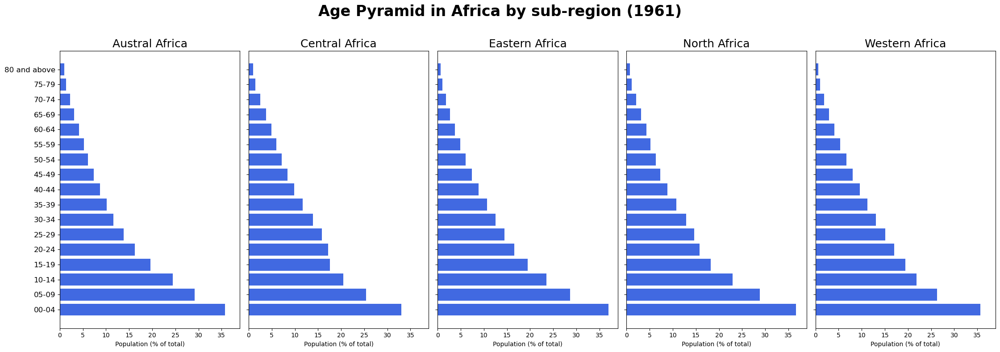

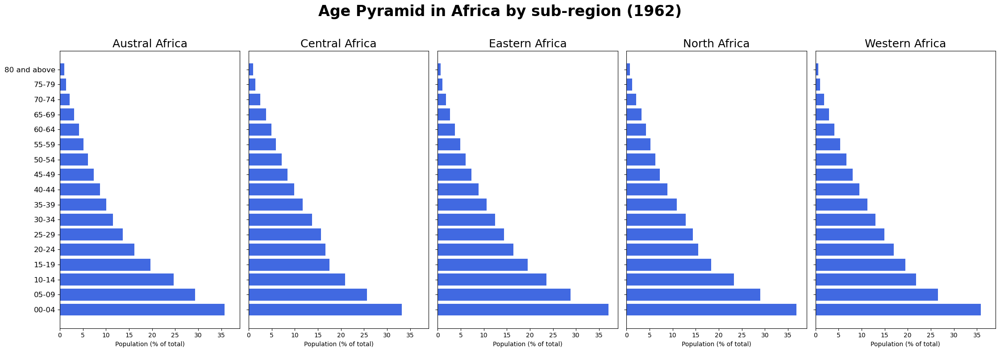

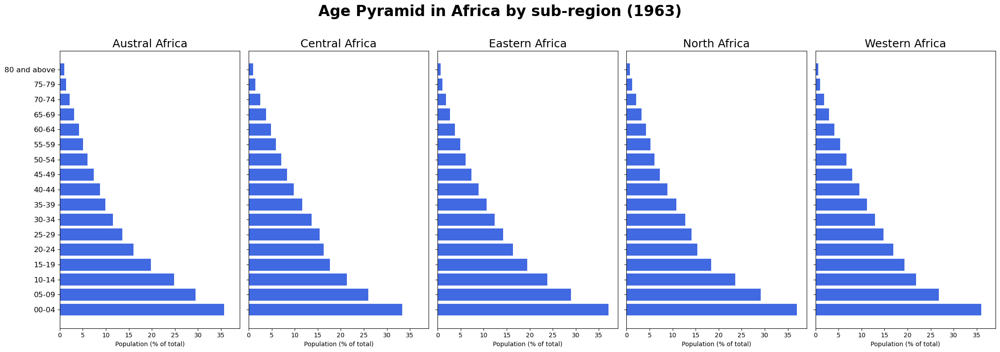

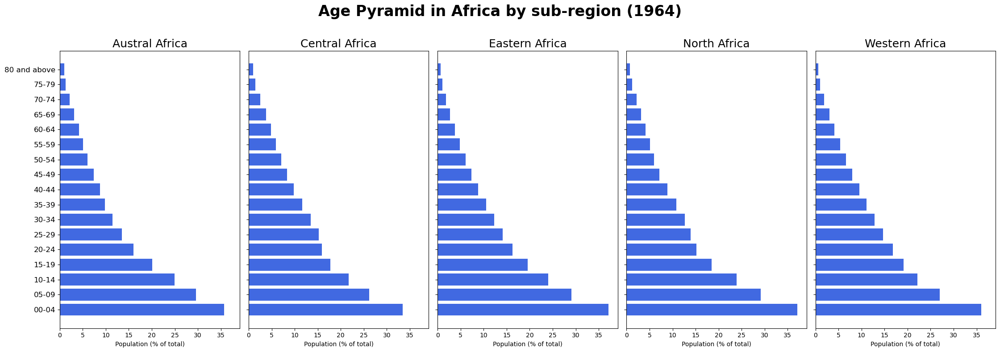

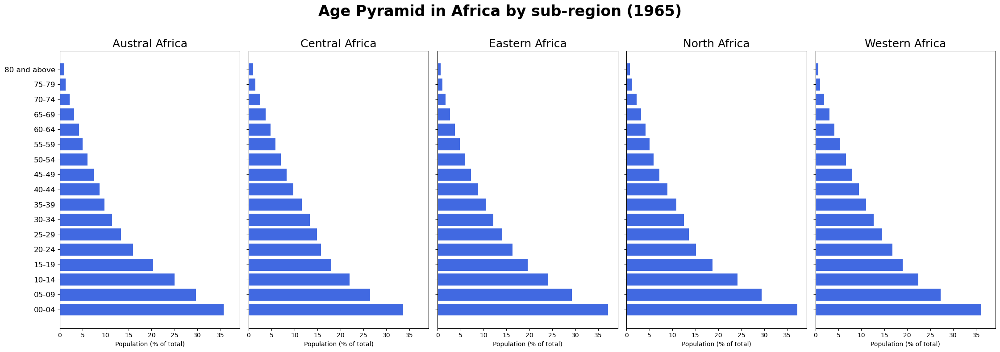

...

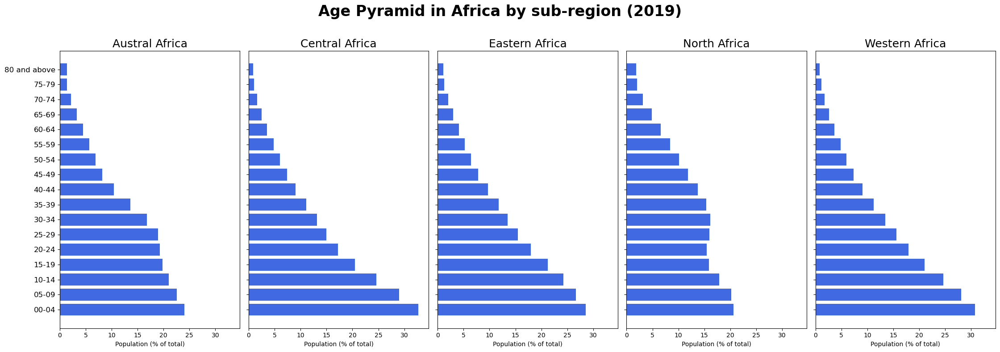

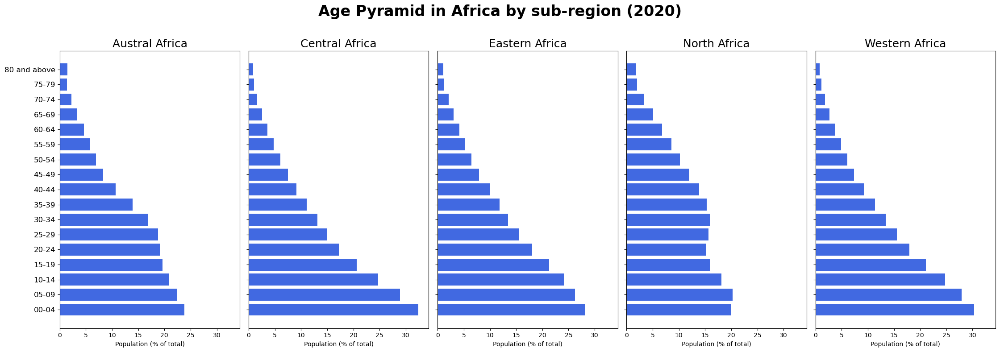

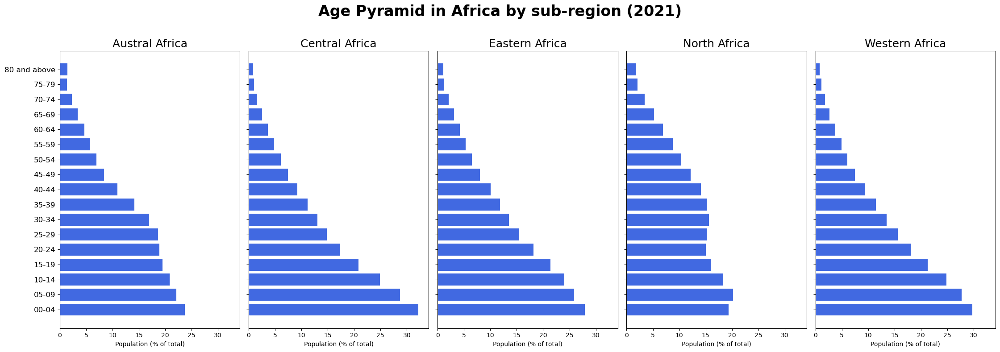

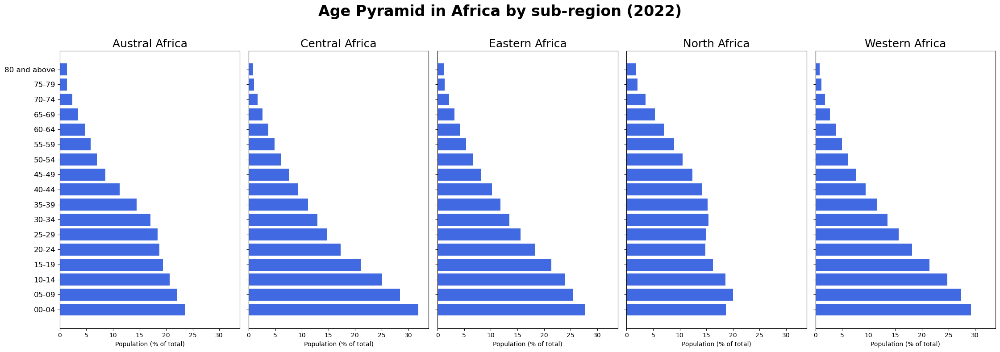

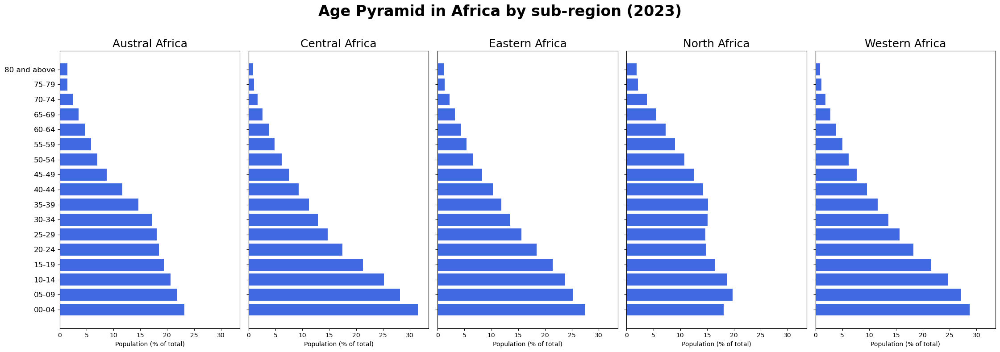

In [20]:
for i in years_list :

        # Select year
        year = i  # Change as needed


        # Define age group columns
        age_groups = [
            'Population ages 00-04, (% of population)',
            'Population ages 05-09, (% of population)',
            'Population ages 10-14, (% of population)',
            'Population ages 15-19, (% of population)',
            'Population ages 20-24, (% of population)',
            'Population ages 25-29, (% of population)',
            'Population ages 30-34, (% of population)',
            'Population ages 35-39, (% of population)',
            'Population ages 40-44, (% of population)',
            'Population ages 45-49, (% of population)',
            'Population ages 50-54, (% of population)',
            'Population ages 55-59, (% of population)',
            'Population ages 60-64, (% of population)',
            'Population ages 65-69, (% of population)',
            'Population ages 70-74, (% of population)',
            'Population ages 75-79, (% of population)',
            'Population ages 80 and above, (% of population)'
        ]

        # Filter data for the selected year + continent = Africa
        df_filtered = new_df_5[new_df_5['years'] == year]
        df_filtered = df_filtered[df_filtered['continent']=='Africa']

        # Group by continent and sum up population percentages
        df_continent = df_filtered.groupby('sub-region')[age_groups].mean().reset_index()

        # Get the list of sub-region
        continents = df_continent['sub-region'].unique()
        num_continents = len(continents)

        # Find the maximum population percentage for scaling x-axis
        max_population = df_continent[age_groups].values.max()

        # Set up facet grid
        fig, axes = plt.subplots(nrows=1, ncols=num_continents, figsize=(num_continents * 4.5, 8), sharey=True)

        # Ensure axes is iterable even if there is only one continent
        if num_continents == 1:
            axes = [axes]

        # Loop through each continent and plot
        for i, continent in enumerate(continents):
            ax = axes[i]
            continent_data = df_continent[df_continent['sub-region'] == continent]

            # Extract population percentages
            population_percentages = continent_data[age_groups].values.flatten()
            
            # Clean age labels
            age_labels = [age.split('ages ')[1].split(',')[0] for age in age_groups]
            y = np.arange(len(age_labels))  # Position for each bar

            # Create horizontal bar chart
            ax.barh(y, population_percentages, color='royalblue')

            # Add labels
            ax.set_title(continent, fontsize=18)
            ax.set_xlabel("Population (% of total)", fontsize=10)
            
            # Show y-axis labels for all plots
            ax.set_yticks(y)
            ax.set_yticklabels(age_labels, fontsize=12)

            # Set the same x-axis scale for all plots
            ax.set_xlim(0, max_population + 2)  # Add small padding

            # Reverse age order
            # ax.invert_yaxis()

        # Add a shared title
        fig.suptitle(f"Age Pyramid in Africa by sub-region ({year})", fontsize=24, fontweight="bold")

        # Adjust layout
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)  # Add space for the title

        # Show plot
        plt.savefig(f'../Outputs/Population_distribution/Africa_population_{year}')
        # plt.show()

## generate file for countries in north africa

In [21]:
print(new_df_5.columns)
print(new_df_5['sub-region'].unique())

Index(['Unnamed: 0', 'country', 'years', 'Population, total',
       'Population ages 00-04, (% of population)',
       'Population ages 05-09, (% of population)',
       'Population ages 10-14, (% of population)',
       'Population ages 15-19, (% of population)',
       'Population ages 20-24, (% of population)',
       'Population ages 25-29, (% of population)',
       'Population ages 30-34, (% of population)',
       'Population ages 35-39, (% of population)',
       'Population ages 40-44, (% of population)',
       'Population ages 45-49, (% of population)',
       'Population ages 50-54, (% of population)',
       'Population ages 55-59, (% of population)',
       'Population ages 60-64, (% of population)',
       'Population ages 65-69, (% of population)',
       'Population ages 70-74, (% of population)',
       'Population ages 75-79, (% of population)',
       'Population ages 80 and above, (% of population)', 'iso3Code',
       'iso2Code', 'region', 'continent', 'sub-regio

C:\Users\nazim\AppData\Local\Temp\ipykernel_6792\1096144083.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=num_continents, figsize=(num_continents * 4.5, 8), sharey=True)


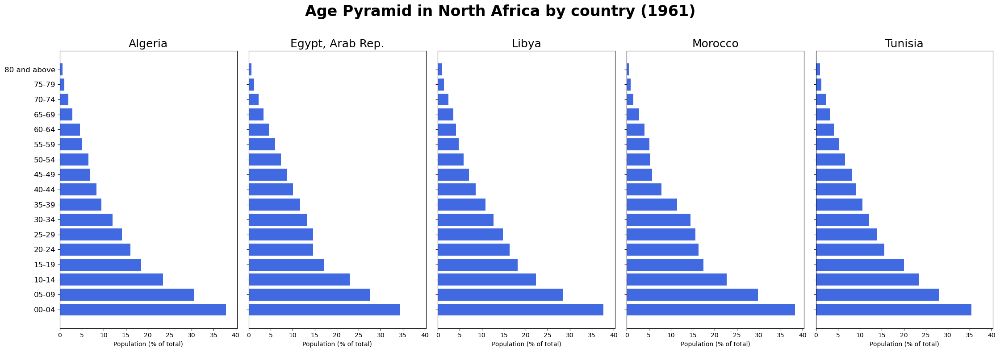

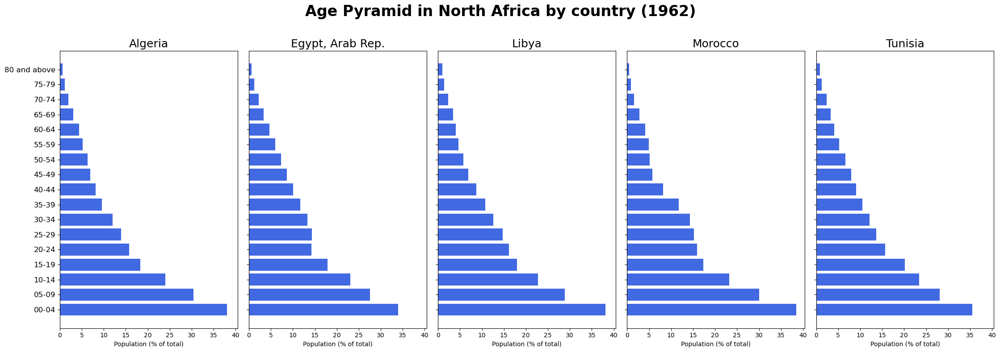

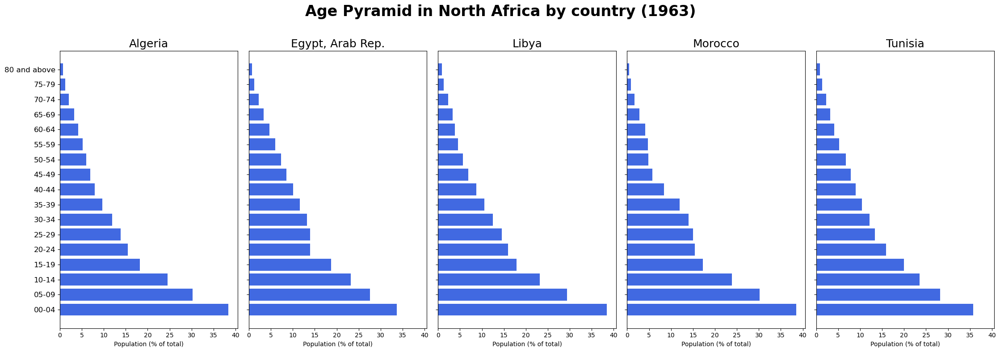

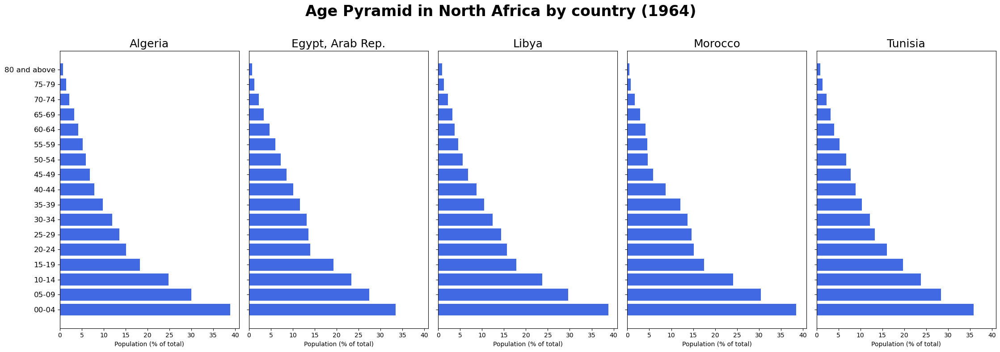

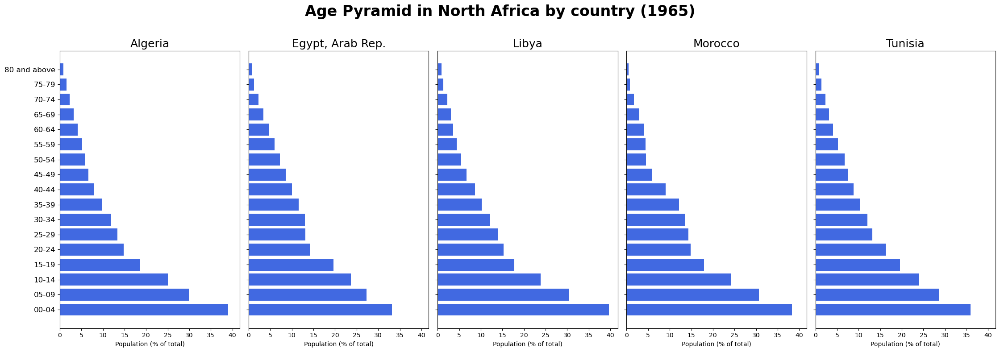

...

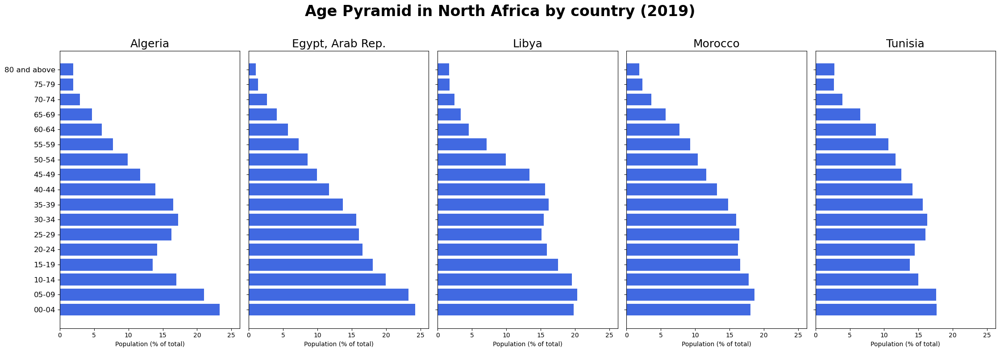

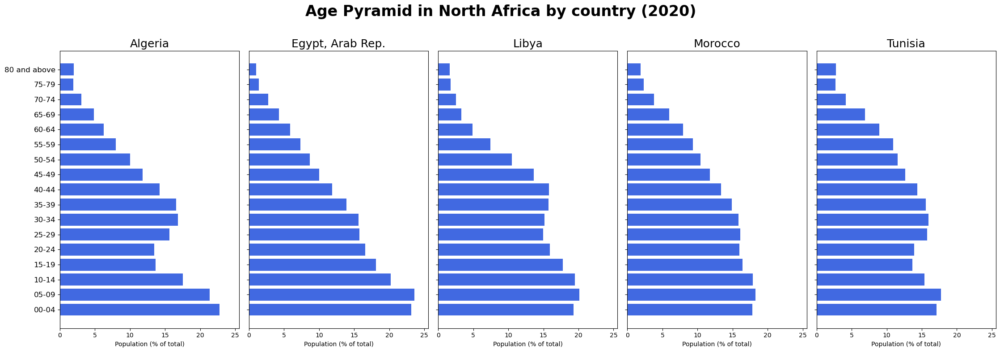

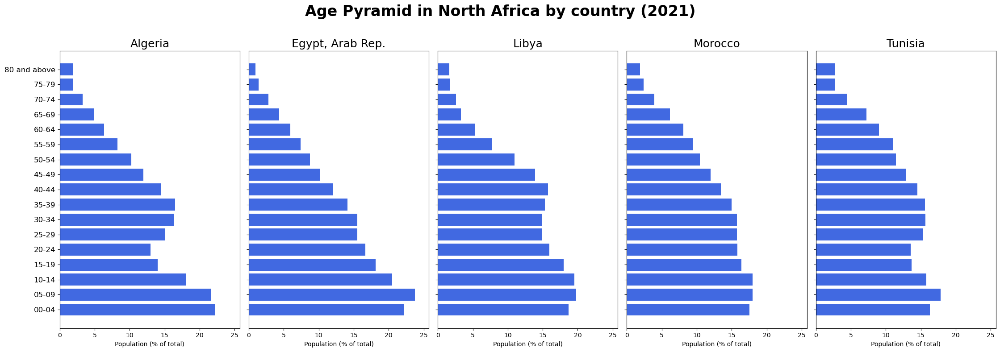

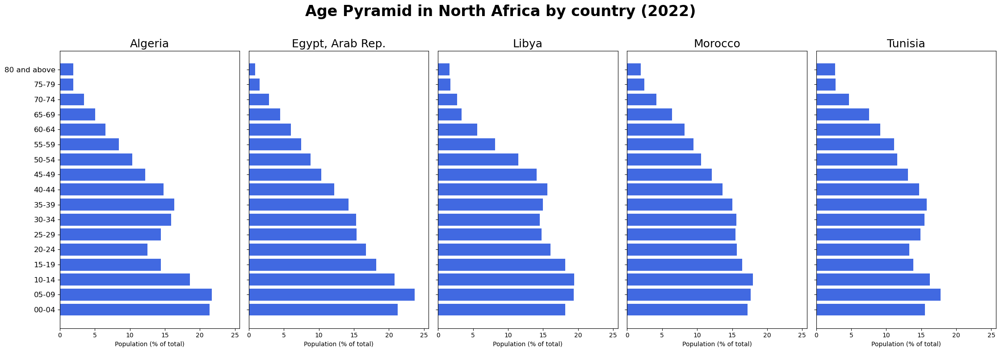

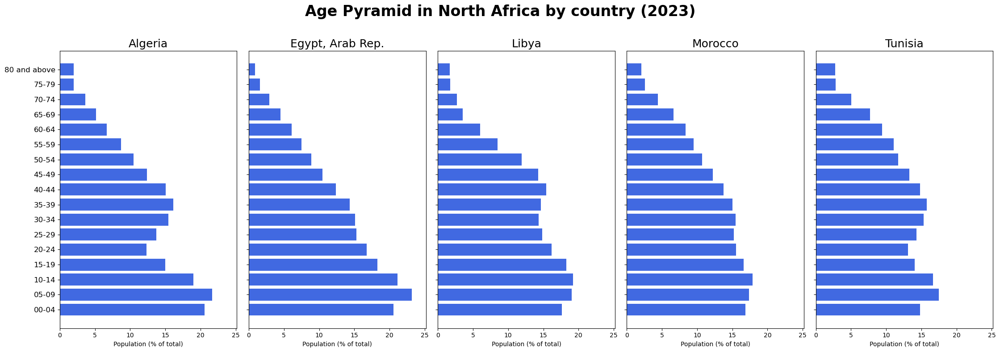

In [22]:
for i in years_list :

        # Select year
        year = i  # Change as needed


        # Define age group columns
        age_groups = [
            'Population ages 00-04, (% of population)',
            'Population ages 05-09, (% of population)',
            'Population ages 10-14, (% of population)',
            'Population ages 15-19, (% of population)',
            'Population ages 20-24, (% of population)',
            'Population ages 25-29, (% of population)',
            'Population ages 30-34, (% of population)',
            'Population ages 35-39, (% of population)',
            'Population ages 40-44, (% of population)',
            'Population ages 45-49, (% of population)',
            'Population ages 50-54, (% of population)',
            'Population ages 55-59, (% of population)',
            'Population ages 60-64, (% of population)',
            'Population ages 65-69, (% of population)',
            'Population ages 70-74, (% of population)',
            'Population ages 75-79, (% of population)',
            'Population ages 80 and above, (% of population)'
        ]

        # Filter data for the selected year + continent = Africa
        df_filtered = new_df_5[new_df_5['years'] == year]
        df_filtered = df_filtered[df_filtered['sub-region']=='North Africa']

        # Group by continent and sum up population percentages
        df_continent = df_filtered.groupby('country')[age_groups].mean().reset_index()

        # Get the list of sub-region
        continents = df_continent['country'].unique()
        num_continents = len(continents)

        # Find the maximum population percentage for scaling x-axis
        max_population = df_continent[age_groups].values.max()

        # Set up facet grid
        fig, axes = plt.subplots(nrows=1, ncols=num_continents, figsize=(num_continents * 4.5, 8), sharey=True)

        # Ensure axes is iterable even if there is only one continent
        if num_continents == 1:
            axes = [axes]

        # Loop through each continent and plot
        for i, continent in enumerate(continents):
            ax = axes[i]
            continent_data = df_continent[df_continent['country'] == continent]

            # Extract population percentages
            population_percentages = continent_data[age_groups].values.flatten()
            
            # Clean age labels
            age_labels = [age.split('ages ')[1].split(',')[0] for age in age_groups]
            y = np.arange(len(age_labels))  # Position for each bar

            # Create horizontal bar chart
            ax.barh(y, population_percentages, color='royalblue')

            # Add labels
            ax.set_title(continent, fontsize=18)
            ax.set_xlabel("Population (% of total)", fontsize=10)
            
            # Show y-axis labels for all plots
            ax.set_yticks(y)
            ax.set_yticklabels(age_labels, fontsize=12)

            # Set the same x-axis scale for all plots
            ax.set_xlim(0, max_population + 2)  # Add small padding

            # Reverse age order
            # ax.invert_yaxis()

        # Add a shared title
        fig.suptitle(f"Age Pyramid in North Africa by country ({year})", fontsize=24, fontweight="bold")

        # Adjust layout
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)  # Add space for the title

        # Show plot
        plt.savefig(f'../Outputs/Population_distribution/North_Africa_population_{year}')
        # plt.show()